In [1]:
# https://github.com/bentrevett/pytorch-sentiment-analysis
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import numpy as np
from matplotlib import pyplot as plt
import os
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split

%matplotlib inline

In [2]:
os.chdir("..")

In [3]:
from mlexplain.vision.utils import load_img, plot_img, plot_img_heatmap

#### Defining function for visualizing heatmaps for multiple sces

In [4]:
def plot_mask_weighted_heatmaps_multiple_sces(sces, list_images, titles=None):
    fig = plt.figure(figsize=(len(sces) * 5, len(list_images[0]) * 4))

    cur_idx = 1
    for img_idx in range(list_images[0].shape[0]):
        for sce, images in zip(sces, list_images):
            heatmap = 0
            for feature_idx, mask_entry in enumerate(sce.masks[img_idx]):
                if mask_entry.item() < 0:
                    heatmap -= mask_entry * sce.X[img_idx, feature_idx, :, :].unsqueeze(0).unsqueeze(0)

            heatmap = nn.Upsample(size=images.shape[2:], mode='bilinear')(heatmap)

            ax = fig.add_subplot(images.shape[0], len(sces), cur_idx)
            if img_idx == 0 and titles is not None:
                ax.set_title(titles[cur_idx - 1], fontsize=16)
            ax.set_xticks([])
            ax.set_yticks([])

            cur_idx += 1
            

            plot_img_heatmap(images[img_idx], heatmap, ax=ax, alpha=0.5)

### Getting the model

In [8]:
class Extractor():
    """
        Extracts cam features from the model
    """
    def __init__(self, model):
        self.model = model
        for param in self.model.features.parameters():
            param.requires_grad = False

    def forward_pass_on_convolutions(self, x):
        """
            Does a forward pass on convolutions, hooks the function at given layer
        """
        conv_output = None
        for module_pos, module in self.model.features._modules.items():
            x = module(x)  # Forward
        return x
    
    def forward_pass_from_convolutions(self, output_from_convolutions):
        x = output_from_convolutions.view(output_from_convolutions.size(0), -1)
        x = self.model.classifier(x)
        return x
    
    def __call__(self, x):
        return self.forward_pass_from_convolutions(x)
    
    def eval(self):
        self.model.eval()
    
    def zero_grad():
        self.model.zero_grad()

In [9]:
vgg16_model = torchvision.models.vgg16(pretrained=True)

In [10]:
extractor = Extractor(vgg16_model)
model = extractor
model.eval()

### Feature map visualizer

In [9]:
class SaveFeatures():
    def __init__(self, module):
        self.hook = module.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output):
        self.features = torch.tensor(output,requires_grad=True)
    def close(self):
        self.hook.remove()

class FilterVisualizer():
    def __init__(self, model, size=228, upscaling_steps=12, upscaling_factor=1.2):
        self.size, self.upscaling_steps, self.upscaling_factor = size, upscaling_steps, upscaling_factor
        self.model = model

    def visualize(self, filter, lr=0.5, opt_steps=10, blur=None, ax=None):
        layer = -3
        sz = self.size
        img = np.float32(np.random.uniform(0.0, 1.0, (1, 3, sz, sz)))  # generate random image
        # activations = SaveFeatures(list(self.model.features.children())[layer])  # register hook

        for _ in range(self.upscaling_steps):  # scale the image up upscaling_steps times
            img_var = torch.tensor(img, requires_grad=True)  # convert image to Variable that requires grad
            optimizer = torch.optim.Adam([img_var], lr=lr, weight_decay=1e-6)
            for n in range(opt_steps):  # optimize pixel values for opt_steps times
                loss = -self.model(img_var)[0, filter].mean()
                # loss = -activations.features[0, filter].mean()
                loss.backward()
                optimizer.step()
                optimizer.zero_grad()
                print(loss)
            img = img_var.detach().numpy()[0].transpose(1, 2, 0)
            self.output = img
            sz = int(self.upscaling_factor * sz)  # calculate new image size
        # self.save(layer, filter)
        if ax:
            plt.imshow(self.output, ax=ax)
        else:
            plt.imshow(self.output)
        
    def save(self, layer, filter):
        plt.imsave("layer_"+str(layer)+"_filter_"+str(filter)+".jpg", np.clip(self.output, 0, 1))
        
def visualize_filter(filter, ax=None):
    FV = FilterVisualizer(vgg16_model.features, size=228, upscaling_steps=1, upscaling_factor=1.2)
    FV.visualize(filter)

### Read and display the data

In [6]:
def read_data(start=1, end=10):
    res = None
    fpath = 'data/pics/cat_{}.jpg'
    for i in range(start, end):
        img = load_img(fpath.format(i), imagenet=True)
        if res is None:
            res = img
        else:
            res = torch.cat((res, img), 0)
    return res

def read_data_dir(dirname, start=0, end=10):
    res = None
    fpath = f'data/pics/{dirname}/{dirname}' + '_{}.jpg'
    fpath2 = f'data/pics/{dirname}/{dirname}' + '_{}.png'
    fpath3 = f'data/pics/{dirname}/{dirname}' + '_{}.jpeg'
    for i in range(start, end):
        if os.path.exists(fpath.format(i)):
            img = load_img(fpath.format(i), imagenet=True)
        elif os.path.exists(fpath2.format(i)):
            img = load_img(fpath2.format(i), imagenet=True)
        elif os.path.exists(fpath3.format(i)):
            img = load_img(fpath3.format(i), imagenet=True)
        else:
            continue
        
        if res is None:
            res = img
        else:
            res = torch.cat((res, img), 0)
    return res

In [13]:
from mlexplain.utils import read_imagenet_clsidx_to_labels
clsidx_to_labels = read_imagenet_clsidx_to_labels('data/imagenet_1000_clsidx_to_labels.json')

### Read cat_wrong data

In [32]:
cat_wrong_target = 285
cat_wrong_data = read_data_dir('cat_wrong')
cat_wrong_data_convolutions = extractor.forward_pass_on_convolutions(cat_wrong_data)
print(cat_wrong_data_convolutions.shape)

torch.Size([1, 512, 7, 7])


In [42]:
print(clsidx_to_labels[285])
torch.argsort(model(cat_wrong_data_convolutions)[0], descending=True)

Egyptian_cat


tensor([285, 281, 287, 283, 282, 539, 552, 457, 478, 434, 918, 769, 284, 761,
        904, 508, 885, 700, 673, 470, 845, 289, 332, 622, 811, 806, 896, 356,
        333, 658, 876, 288, 840, 818, 968, 626, 722, 496, 543, 794, 620, 629,
        568, 850, 435, 773, 519, 419, 831, 463, 591, 905, 359, 954, 588, 937,
        824, 593, 748, 852, 753, 203, 767, 883, 929, 438, 750, 782, 443, 681,
        534, 987, 711, 760, 549, 533, 154, 644, 953, 855, 911, 907, 608, 357,
        327, 279, 709, 469, 636, 999, 828, 897, 330, 903, 619, 957, 998, 728,
        741, 542, 528, 290, 611, 697, 259, 398, 331, 605, 827, 721, 797, 429,
        358, 293, 949, 664, 778, 112, 969, 515, 487, 725, 846, 526, 893, 742,
        783, 446, 551, 680, 909, 731, 248, 647, 481, 498, 579, 585, 719, 950,
        793, 942, 809, 631, 292, 504, 506, 713, 532, 453, 789, 735, 459, 250,
        879, 245, 749, 899, 971, 858, 455, 251, 966, 151, 810, 572, 898, 720,
        804, 606, 861, 837, 785, 790, 521, 452, 921, 409, 286, 8

#### Read cat_dog data
285, 253 -- shows pretty decent result from pic #5

In [198]:
cat_dog_target_cat, cat_dog_target_dog = 285, 253
cat_dog_data = read_data_dir('cat_dog')
cat_dog_data_convolutions = extractor.forward_pass_on_convolutions(cat_dog_data)
print(cat_dog_data_convolutions.shape)

torch.Size([1, 512, 7, 7])


In [201]:
print(clsidx_to_labels[253])
torch.argsort(model(cat_dog_data_convolutions)[0], descending=True)

basenji


tensor([282, 285, 281, 287, 852, 457, 434, 876, 151, 999, 263, 463, 850, 478,
        904, 250, 435, 937, 173, 248, 443, 283, 987, 700, 215, 588, 539, 620,
        274, 356, 728, 918, 968, 273, 253, 794, 738, 750, 284, 721, 998, 782,
        292, 831, 286, 722, 186, 264, 508, 948, 333, 516, 773, 373, 790, 376,
        929, 496, 797, 419, 504, 664, 415, 277, 519, 549, 521, 611, 896, 697,
        955, 761, 428, 658, 778, 806, 338, 520, 861, 291, 678, 208, 231, 681,
        452, 765, 673, 470, 760, 692, 185, 855, 207, 614, 742, 260, 211, 412,
        809, 431, 969, 943, 805, 859, 218, 811, 897, 335, 851, 259, 622, 279,
        529, 680, 885, 104, 382, 905, 298, 965, 716, 568, 188, 923, 868, 910,
        964, 804, 931, 950, 156, 916, 720, 911, 293, 184, 659, 278, 290, 953,
        841, 753, 543, 669, 272, 411, 949, 247, 380, 387, 676,  46, 105, 838,
        209, 203, 429, 843, 453, 227, 230, 249, 899, 280, 489, 952, 947, 446,
        865, 928, 371, 934, 552, 725, 921, 883, 703, 631, 898, 3

#### Read veg data

In [217]:
veg_target_cucumber, veg_target_bell = 943, 945
veg_data = read_data_dir('veg')
veg_data_convolutions = extractor.forward_pass_on_convolutions(veg_data)
print(veg_data_convolutions.shape)

torch.Size([1, 512, 7, 7])


In [215]:
print(clsidx_to_labels[940])
torch.argsort(model(veg_data_convolutions)[0], descending=True)

spaghetti_squash


tensor([943, 945, 939, 941, 942, 948, 940, 937, 924, 949, 998, 936, 868, 954,
        987, 952, 934, 582, 923, 950, 938, 944, 962, 953, 990, 666, 930, 931,
        499, 935, 951, 773, 907, 415, 910, 956, 790, 738, 928, 659, 618, 885,
        769, 957, 470, 828, 929, 965, 955, 883, 988, 989, 809, 725, 122, 641,
        959, 502, 473, 658,  31, 933, 966, 692, 784, 588, 519, 679, 631, 813,
        440, 629, 947, 543, 521, 737, 506, 567, 600, 503, 572, 927, 584, 532,
        488, 969, 909, 533, 845, 709,  55, 806, 398, 960, 463, 112, 968, 428,
        964, 748, 899, 849, 720, 522, 925, 616, 855, 434, 963, 580, 496, 762,
        329, 647, 797, 607, 778,  32, 509, 911, 118, 922, 918, 997, 435, 512,
        563, 700, 626, 840, 587, 824, 591,  59, 961, 792, 932, 719, 478, 333,
        926, 315, 876, 338, 124, 731, 721, 774, 767, 996, 412, 539, 711, 114,
        528, 804, 749, 630, 684,  39, 623, 850, 696, 728, 673, 544, 859, 693,
        452, 838, 443, 898, 472, 514, 901, 680,  46,  87, 852, 4

#### Read arctic_fox data

In [11]:
arctic_fox_target = 280
arctic_fox_data = read_data_dir('arctic_fox')
arctic_fox_data_convolutions = extractor.forward_pass_on_convolutions(arctic_fox_data)
print(arctic_fox_data_convolutions.shape)

torch.Size([7, 512, 7, 7])


In [12]:
print(clsidx_to_labels[279])
torch.argsort(model(arctic_fox_data_convolutions)[1], descending=True)

NameError: name 'clsidx_to_labels' is not defined

### Read LYNX data

In [231]:
lynx_target = 287
lynx_data = read_data_dir('lynx')
lynx_data_convolutions = extractor.forward_pass_on_convolutions(lynx_data)
print(lynx_data_convolutions.shape)

torch.Size([10, 512, 7, 7])


In [11]:
print(clsidx_to_labels[287])
torch.argsort(model(lynx_data_convolutions)[9], descending=True)

lynx


tensor([287, 285, 289, 288, 282, 281, 290, 293, 904, 562, 291, 278, 280, 286,
        331,  51, 832, 272,  66, 568, 483, 855, 664, 326, 335, 292, 794, 112,
        330, 750, 276, 782, 283,  36, 649, 106, 475, 831, 840, 988, 937, 728,
        298,  47, 953, 303,  68, 818, 663, 753,  24, 350, 725, 896, 277, 299,
        457, 497, 186, 918, 363, 611, 606, 322,  39, 270, 409, 104, 885, 769,
         43, 377,  41, 463, 360, 274, 858,  82, 353, 269, 846,  49, 958, 539,
        715, 327, 905, 620, 284, 970, 968,  69, 357, 979, 626, 340, 279, 189,
        884, 508, 355, 851, 426, 396, 778,  32, 356, 857, 501, 133, 109, 469,
        435, 956, 682, 474, 998, 271, 868, 406, 619, 596, 863,  33,  38,  42,
        763, 203, 212, 700, 673, 897, 825, 187, 564, 538, 599, 847, 850, 828,
        849, 192, 622, 824, 996, 749, 329, 987, 117, 198, 789,  67, 515, 516,
        556, 219, 328,  70, 294, 793, 835,  35, 876, 532, 698, 527, 579, 380,
        183,  50, 978, 837, 623, 592, 524, 757, 656, 498, 867, 7

### Read tiger_cat data

In [24]:
tiger_cat_target = 282
tiger_cat_data = read_data_dir('tiger_cat')
tiger_cat_data_convolutions = extractor.forward_pass_on_convolutions(tiger_cat_data)
print(tiger_cat_data_convolutions.shape)

torch.Size([8, 512, 7, 7])


In [25]:
print(clsidx_to_labels[282])
torch.argsort(model(tiger_cat_data_convolutions)[7], descending=True)

tiger_cat


tensor([285, 282, 281, 287, 292, 340, 840, 288, 276, 286, 753, 568, 290, 519,
        572,  38, 876, 293, 478, 539, 514, 611, 516, 676, 289, 463, 896, 700,
        790, 904, 588, 435, 811, 738, 846, 553, 534, 532,  51, 284, 794, 728,
        883, 251, 112,  21, 769, 520,  83, 151, 729, 892,   8, 619, 543, 750,
        905, 552, 861, 280, 431, 868, 778, 187,  82, 227, 725, 457, 283, 697,
        879, 708, 999, 831,   7, 275, 355, 462, 600, 274,  41, 186,  24, 793,
        272, 412, 533, 765, 885, 918, 193, 492, 897, 526, 637,  86, 493, 723,
        469, 291, 448, 453, 515, 899, 782, 903, 760, 898, 968, 658, 402, 452,
        201, 857, 353, 264, 299,  12, 212, 813, 894, 278, 545, 917, 428, 664,
        659, 357, 735, 253, 851, 406, 806, 356, 496, 643, 268, 756, 880, 593,
        332, 761, 845, 622, 863,  43, 504, 673, 804, 816, 331, 910, 277,  88,
        396, 210, 173, 451, 808,  85, 722, 921, 789, 470, 736, 674, 171, 618,
        421, 562, 423, 352, 273, 987, 786, 383, 195, 434, 742, 8

### Read paper_towel data

In [46]:
paper_towel_target = 700
paper_towel_data = read_data_dir('paper_towel')
paper_towel_data_convolutions = extractor.forward_pass_on_convolutions(paper_towel_data)
print(paper_towel_data_convolutions.shape)

torch.Size([8, 512, 7, 7])


In [48]:
print(clsidx_to_labels[700])
torch.argsort(model(paper_towel_data_convolutions)[7], descending=True)

paper_towel


tensor([700, 999, 849, 515, 434, 496, 478, 846, 896, 588, 619, 748, 804, 861,
        448, 605, 419, 648, 831, 492, 731, 651, 721, 894, 750, 589, 443, 786,
        754, 606, 632, 549, 587, 502, 516, 899, 859, 411, 473, 805, 806, 910,
        637, 719, 789, 499, 631, 898, 808, 636, 596, 520, 850, 526, 756, 709,
        723, 799, 710, 911, 463, 716, 961, 545, 533, 457, 753, 505, 813, 745,
        868, 778, 600, 844, 794, 774, 811, 828, 431, 695, 728, 539, 818, 725,
        876, 564, 543, 897, 905, 519, 771, 530, 462, 732, 726, 529, 591, 680,
        553, 459, 797, 453, 902, 765, 412, 772, 253, 667, 692, 618, 722, 879,
        504, 893, 151, 264, 598, 532, 171, 435, 474, 666, 195, 785, 851, 696,
        760, 414, 673, 245, 507, 464, 968, 720, 658, 677, 678, 493, 790, 521,
        446,  85, 402, 686, 907, 796, 583, 674, 199, 514, 798, 158, 747, 440,
        901, 610, 185, 470, 883, 263, 653, 769, 784, 184, 904, 947, 626, 773,
        783, 848, 792, 406, 523, 615, 757, 447, 551, 599, 338, 2

### Defining SCE

In [17]:
from mlexplain.sce.image_sce import ImageSCE

#### Experiment 1 (TIGER CAT). LR=0.1, lambda_coef=0.05, mu_coef=0.2

In [18]:
target_class = tiger_cat_target
data = tiger_cat_data
data_convolutions = tiger_cat_data_convolutions

In [19]:
sce = ImageSCE(model, target_class=target_class)

In [20]:
sce.fit(data_convolutions, n_iter=100, lr=0.1, lambda_coef=0.05, mu_coef=0.2, verbose_every_iterations=10, force_masks_init=False)

[0/100] Cost: 12.31329345703125 [12.31329345703125, 0.0, 0.0]
[10/100] Cost: 11.446587562561035 [11.18229866027832, 0.23211021721363068, 0.032178930938243866]
[20/100] Cost: 10.71969985961914 [10.233366012573242, 0.42581525444984436, 0.06051788479089737]
[30/100] Cost: 10.07955551147461 [9.386489868164062, 0.6061922907829285, 0.08687300980091095]
[40/100] Cost: 9.518865585327148 [8.633600234985352, 0.773392915725708, 0.11187239736318588]
[50/100] Cost: 9.03007984161377 [7.967728137969971, 0.9274528622627258, 0.13489913940429688]
[60/100] Cost: 8.608755111694336 [7.384145736694336, 1.0685385465621948, 0.15607041120529175]
[70/100] Cost: 8.244025230407715 [6.87100076675415, 1.1974468231201172, 0.17557846009731293]
[80/100] Cost: 7.927182197570801 [6.417704105377197, 1.316196084022522, 0.19328229129314423]
[90/100] Cost: 7.644351482391357 [6.008726119995117, 1.4258153438568115, 0.20980969071388245]


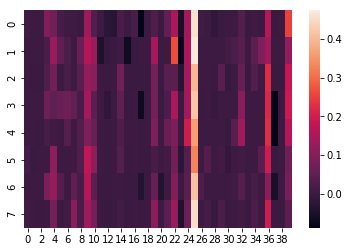

In [21]:
sns.heatmap(sce.masks[:, :40].detach().numpy())

In [22]:
print(torch.argsort(sce.explanation(), descending=False))

tensor([479, 128, 117, 248, 450, 132,  90, 210, 328, 468, 397, 444,  42, 439,
        119, 179, 295, 462, 194, 431, 363, 356,  23, 348,  37,  17, 466, 122,
        339, 167, 135, 379, 232, 253,  63, 355, 370, 269, 172, 413, 171, 298,
        332, 341, 372, 410,  15, 193, 279, 300,  12, 141, 225, 286,  66, 299,
        206,  11,  82, 240, 440, 391, 316, 247,  20, 266, 150,  78, 149, 382,
         13, 412, 507, 357, 199,  28, 246, 208, 169, 306, 280, 173,  30, 454,
        465, 200,  70,  53, 487, 342, 291, 401, 392, 415, 366, 408, 383, 133,
        319, 158, 241, 460,  33, 351, 409, 267,  38, 414, 127, 364, 268, 386,
        314, 483, 389,   1, 170, 104, 452, 496, 346, 195,  54, 160,  71, 429,
         44, 407, 506, 148, 305, 181, 419, 282,   2, 360,  52, 503, 102, 103,
        461,  18, 271, 140, 395,  46, 106, 323, 367, 251, 387, 358, 433,  57,
         75, 270,  91,  84, 442, 309, 203, 492, 369, 293, 283, 196,  67, 349,
        125, 337, 471, 252, 192, 394, 475, 166, 340, 229,  97,  

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/upsampling.py:129: UserWarning: nn.Upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.{} is deprecated. Use nn.functional.interpolate instead.".format(self.name))
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2423: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


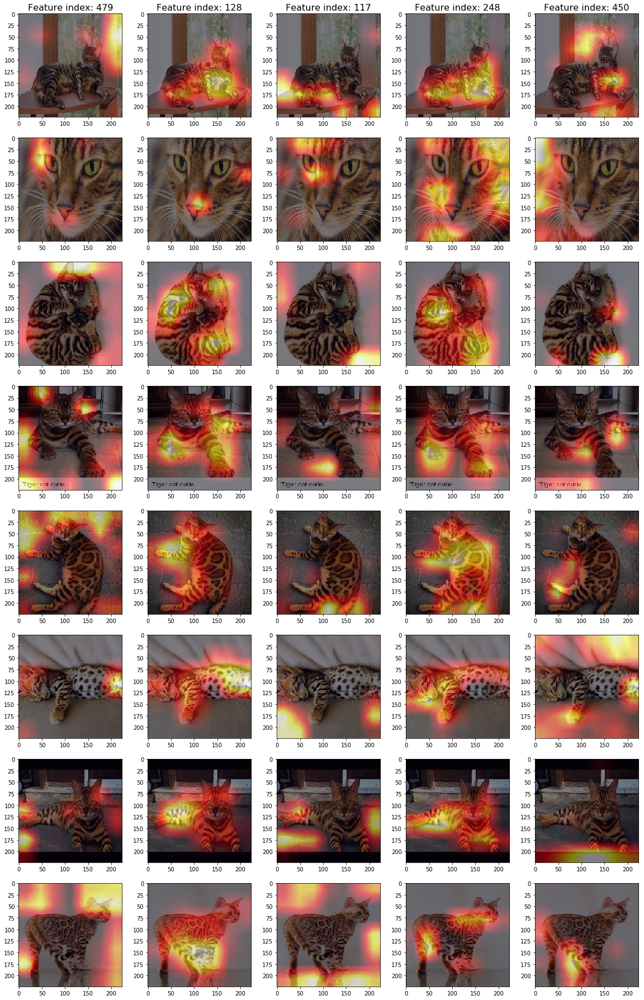

In [26]:
fig = sce.plot_feature_indices_heatmaps(data, sce.top_k_features(k=5, descending=False))

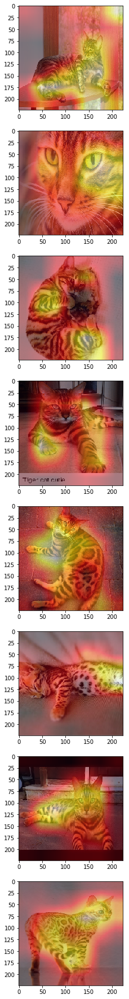

In [32]:
fig = sce.plot_mask_weighted_heatmaps(data)

#### Experiment 2. LR=0.1, lambda_coef=0.05, mu_coef=0.2

In [36]:
target_class = lynx_target
data = lynx_data
data_convolutions = lynx_data_convolutions

In [37]:
sce2 = ImageSCE(model, target_class=target_class)

In [38]:
sce2.fit(data_convolutions, n_iter=100, lr=0.1, lambda_coef=0.05, mu_coef=0.2, verbose_every_iterations=10, force_masks_init=False)

[0/100] Cost: 21.981273651123047 [21.981273651123047, 0.0, 0.0]
[10/100] Cost: 19.786598205566406 [19.393598556518555, 0.3547689616680145, 0.03823048248887062]
[20/100] Cost: 17.88391876220703 [17.144634246826172, 0.6661443114280701, 0.07314112037420273]
[30/100] Cost: 16.239320755004883 [15.180465698242188, 0.9527131915092468, 0.10614296048879623]
[40/100] Cost: 14.79787540435791 [13.441096305847168, 1.2187211513519287, 0.13805754482746124]
[50/100] Cost: 13.538811683654785 [11.905569076538086, 1.4649858474731445, 0.1682569533586502]
[60/100] Cost: 12.469385147094727 [10.583501815795898, 1.6890649795532227, 0.1968187540769577]
[70/100] Cost: 11.557339668273926 [9.439836502075195, 1.8939037322998047, 0.22359950840473175]
[80/100] Cost: 10.784967422485352 [8.457362174987793, 2.079476833343506, 0.24812889099121094]
[90/100] Cost: 10.14570426940918 [7.6304802894592285, 2.2449285984039307, 0.2702946960926056]


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/upsampling.py:129: UserWarning: nn.Upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.{} is deprecated. Use nn.functional.interpolate instead.".format(self.name))
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2423: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


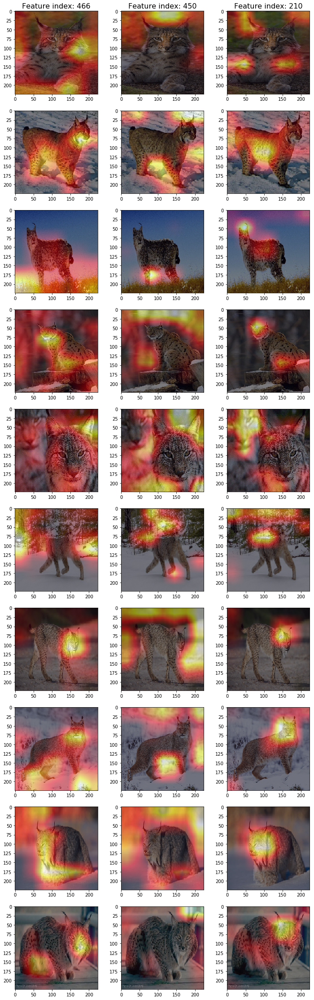

In [39]:
fig = sce2.plot_feature_indices_heatmaps(data, sce2.top_k_features(k=3, descending=False))

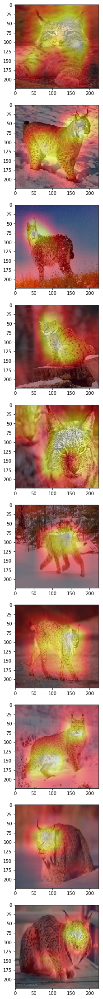

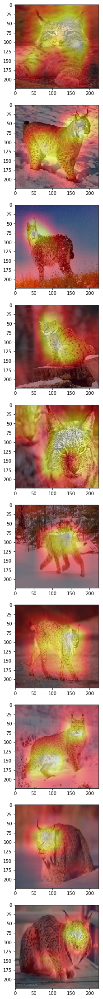

In [40]:
sce2.plot_mask_weighted_heatmaps(data)

#### Experiment 3. LR=0.1, lambda_coef=0.05, mu_coef=0.2

In [49]:
target_class = paper_towel_target
data = paper_towel_data
data_convolutions = paper_towel_data_convolutions

In [50]:
sce3 = ImageSCE(model, target_class=target_class)

In [51]:
sce3.fit(data_convolutions, n_iter=100, lr=0.1, lambda_coef=0.05, mu_coef=0.2, verbose_every_iterations=10, force_masks_init=False)

[0/100] Cost: 27.31533432006836 [27.31533432006836, 0.0, 0.0]
[10/100] Cost: 24.939836502075195 [24.485280990600586, 0.40355783700942993, 0.0509975366294384]
[20/100] Cost: 22.822952270507812 [21.965068817138672, 0.7603415250778198, 0.09754236787557602]
[30/100] Cost: 20.886150360107422 [19.64423370361328, 1.1005502939224243, 0.14136618375778198]
[40/100] Cost: 19.137325286865234 [17.532392501831055, 1.4220784902572632, 0.1828538030385971]
[50/100] Cost: 17.626039505004883 [15.687577247619629, 1.7176202535629272, 0.2208414524793625]
[60/100] Cost: 16.34475326538086 [14.102038383483887, 1.9871562719345093, 0.2555583417415619]
[70/100] Cost: 15.242300033569336 [12.71965503692627, 2.23439884185791, 0.2882460057735443]
[80/100] Cost: 14.30748176574707 [11.529358863830566, 2.4596517086029053, 0.3184710443019867]
[90/100] Cost: 13.498250007629395 [10.48625659942627, 2.665792226791382, 0.3462010324001312]


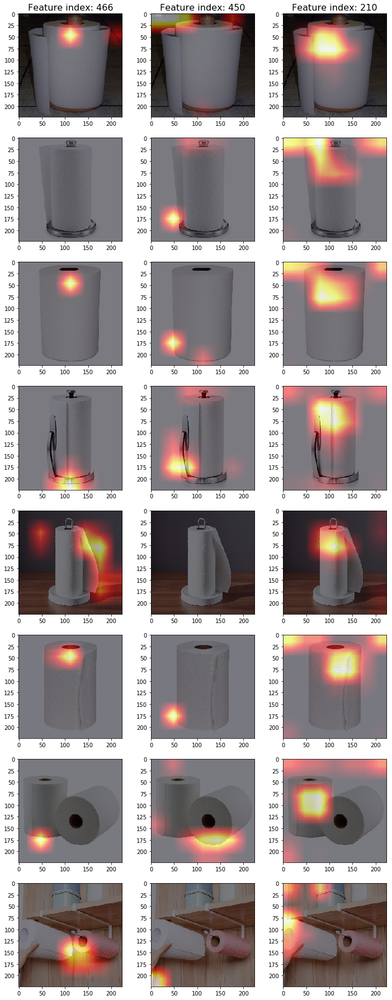

In [52]:
fig = sce3.plot_feature_indices_heatmaps(data, sce2.top_k_features(k=3, descending=False))

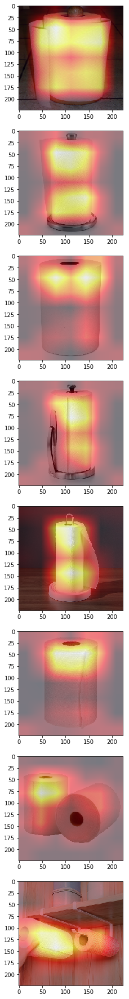

In [54]:
fig = sce3.plot_mask_weighted_heatmaps(data)

#### Experiment 4 (arctic_fox). LR=0.1, lambda_coef=0.05, mu_coef=0.2

In [118]:
target_class = arctic_fox_target
data = arctic_fox_data
data_convolutions = arctic_fox_data_convolutions

In [119]:
sce4 = ImageSCE(model, target_class=target_class)

In [120]:
sce4.fit(arctic_fox_data_convolutions, n_iter=100, lr=0.1, lambda_coef=0.05, mu_coef=0.2, verbose_every_iterations=10, force_masks_init=False)

[0/100] Cost: 10.772247314453125 [10.772247314453125, 0.0, 0.0]
[10/100] Cost: 9.639589309692383 [9.321660041809082, 0.2831575572490692, 0.034771792590618134]
[20/100] Cost: 8.680360794067383 [8.094365119934082, 0.5206177830696106, 0.06537776440382004]
[30/100] Cost: 7.846031665802002 [7.0128655433654785, 0.7389206290245056, 0.09424528479576111]
[40/100] Cost: 7.105129718780518 [6.042552471160889, 0.9402764439582825, 0.12230070680379868]
[50/100] Cost: 6.450417518615723 [5.175265312194824, 1.1265053749084473, 0.1486470252275467]
[60/100] Cost: 5.916849136352539 [4.453604221343994, 1.2899421453475952, 0.1733025312423706]
[70/100] Cost: 5.466721534729004 [3.8339364528656006, 1.437060832977295, 0.1957242488861084]
[80/100] Cost: 5.0765380859375 [3.2895333766937256, 1.5702414512634277, 0.21676340699195862]
[90/100] Cost: 4.737250804901123 [2.8084843158721924, 1.692365050315857, 0.2364017218351364]


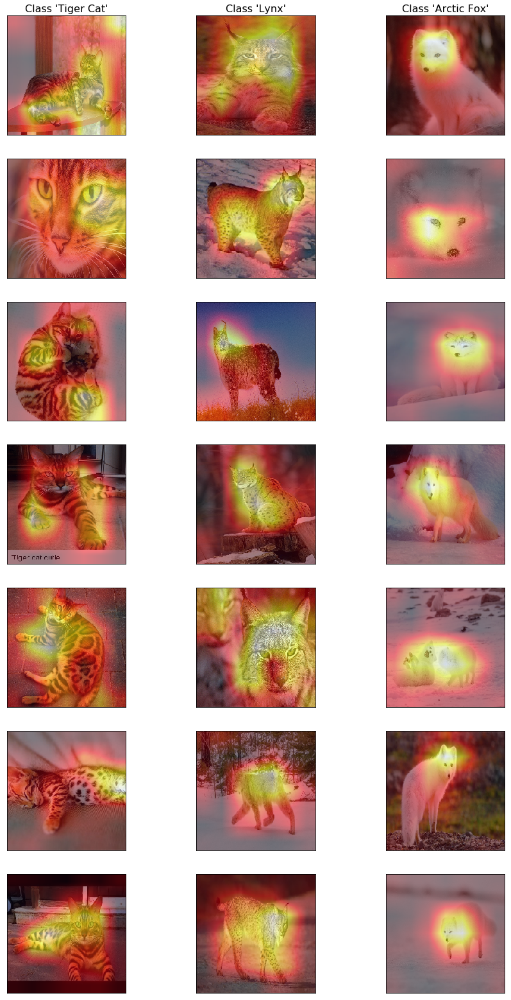

In [121]:
plot_mask_weighted_heatmaps_multiple_sces([sce, sce2, sce4], [tiger_cat_data[:7], lynx_data[:7], arctic_fox_data[:7]], ["Class 'Tiger Cat'", "Class 'Lynx'", "Class 'Arctic Fox'"])

#### Experiment 5 (cat_dog). LR=0.1, lambda_coef=0.05, mu_coef=0.2

In [202]:
sce5_cat = ImageSCE(model, target_class=cat_dog_target_cat)
sce5_dog = ImageSCE(model, target_class=cat_dog_target_dog)

In [203]:
sce5_cat.fit(cat_dog_data_convolutions, n_iter=100, lr=0.1, lambda_coef=0, mu_coef=0, verbose_every_iterations=10, force_masks_init=False)

[0/100] Cost: 9.060538291931152 [9.060538291931152, 0.0, 0.0]
[10/100] Cost: 2.788088798522949 [2.788088798522949, 0.0, 0.0]
[20/100] Cost: 1.186018705368042 [1.186018705368042, 0.0, 0.0]
[30/100] Cost: 0.5824326872825623 [0.5824326872825623, 0.0, 0.0]
[40/100] Cost: 0.211956188082695 [0.211956188082695, 0.0, 0.0]
[50/100] Cost: -0.10120557248592377 [-0.10120557248592377, 0.0, 0.0]
[60/100] Cost: -0.34034019708633423 [-0.34034019708633423, 0.0, 0.0]
[70/100] Cost: -0.5824902057647705 [-0.5824902057647705, 0.0, 0.0]
[80/100] Cost: -0.816521942615509 [-0.816521942615509, 0.0, 0.0]
[90/100] Cost: -1.0919222831726074 [-1.0919222831726074, 0.0, 0.0]


In [204]:
sce5_dog.fit(cat_dog_data_convolutions, n_iter=100, lr=0.1, lambda_coef=0, mu_coef=0, verbose_every_iterations=10, force_masks_init=False)

[0/100] Cost: 4.83944845199585 [4.83944845199585, 0.0, 0.0]
[10/100] Cost: 1.1851859092712402 [1.1851859092712402, 0.0, 0.0]
[20/100] Cost: 0.23575037717819214 [0.23575037717819214, 0.0, 0.0]
[30/100] Cost: -0.217224583029747 [-0.217224583029747, 0.0, 0.0]
[40/100] Cost: -0.5219095349311829 [-0.5219095349311829, 0.0, 0.0]
[50/100] Cost: -0.7574210166931152 [-0.7574210166931152, 0.0, 0.0]
[60/100] Cost: -1.014904499053955 [-1.014904499053955, 0.0, 0.0]
[70/100] Cost: -1.2824856042861938 [-1.2824856042861938, 0.0, 0.0]
[80/100] Cost: -1.5945032835006714 [-1.5945032835006714, 0.0, 0.0]
[90/100] Cost: -1.8975830078125 [-1.8975830078125, 0.0, 0.0]


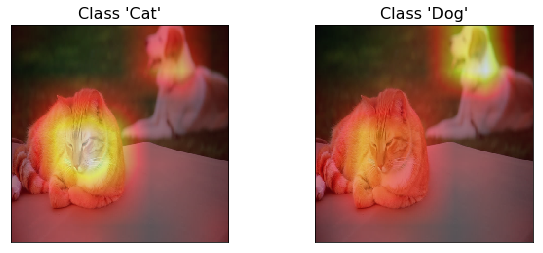

In [205]:
plot_mask_weighted_heatmaps_multiple_sces([sce5_cat, sce5_dog], [cat_dog_data, cat_dog_data], ["Class 'Cat'", "Class 'Dog'"])

### Experiment 6

In [14]:
vgg11_model = torchvision.models.vgg11(pretrained=True)
vgg13_model = torchvision.models.vgg13(pretrained=True)
vgg16_model = torchvision.models.vgg16(pretrained=True)

In [15]:
extractor_vgg11 = Extractor(vgg11_model)
extractor_vgg13 = Extractor(vgg13_model)
extractor_vgg16 = Extractor(vgg16_model)

model_vgg11 = extractor_vgg11
model_vgg13 = extractor_vgg13
model_vgg16 = extractor_vgg16

model_vgg11.eval()
model_vgg13.eval()
model_vgg16.eval()

arctic_fox_data_convolutions_vgg11 = extractor_vgg11.forward_pass_on_convolutions(arctic_fox_data)
arctic_fox_data_convolutions_vgg13 = extractor_vgg13.forward_pass_on_convolutions(arctic_fox_data)
arctic_fox_data_convolutions_vgg16 = extractor_vgg16.forward_pass_on_convolutions(arctic_fox_data)

In [18]:
sce6_vgg11 = ImageSCE(model_vgg11, target_class=arctic_fox_target)
sce6_vgg13 = ImageSCE(model_vgg13, target_class=arctic_fox_target)
sce6_vgg16 = ImageSCE(model_vgg16, target_class=arctic_fox_target)

In [19]:
sce6_vgg11.fit(arctic_fox_data_convolutions_vgg11, n_iter=100, lr=0.1, lambda_coef=0.05, mu_coef=0.2, verbose_every_iterations=10, force_masks_init=False)

[0/100] Cost: 9.173401832580566 [9.173401832580566, 0.0, 0.0]
[10/100] Cost: 7.11290979385376 [6.687636375427246, 0.37234705686569214, 0.05292654037475586]
[20/100] Cost: 5.6014275550842285 [4.845897674560547, 0.6575120091438293, 0.09801791608333588]
[30/100] Cost: 4.480299472808838 [3.446683406829834, 0.8976468443870544, 0.13596923649311066]
[40/100] Cost: 3.626753568649292 [2.3563883304595947, 1.1014838218688965, 0.168881356716156]
[50/100] Cost: 2.9663288593292236 [1.4942423105239868, 1.2733505964279175, 0.19873599708080292]
[60/100] Cost: 2.42358660697937 [0.774039626121521, 1.4239133596420288, 0.22563372552394867]
[70/100] Cost: 1.9690589904785156 [0.15980754792690277, 1.5586905479431152, 0.25056082010269165]
[80/100] Cost: 1.5863850116729736 [-0.36637917160987854, 1.6784566640853882, 0.2743074595928192]
[90/100] Cost: 1.2604767084121704 [-0.8202786445617676, 1.7841600179672241, 0.29659533500671387]


In [20]:
sce6_vgg13.fit(arctic_fox_data_convolutions_vgg13, n_iter=100, lr=0.1, lambda_coef=0.05, mu_coef=0.2, verbose_every_iterations=10, force_masks_init=False)

[0/100] Cost: 9.737227439880371 [9.737227439880371, 0.0, 0.0]
[10/100] Cost: 8.363572120666504 [8.010961532592773, 0.3077392876148224, 0.04487178474664688]
[20/100] Cost: 7.291722774505615 [6.658369541168213, 0.5499219298362732, 0.08343116194009781]
[30/100] Cost: 6.463642597198486 [5.5889692306518555, 0.7576184868812561, 0.11705493927001953]
[40/100] Cost: 5.77945613861084 [4.6904616355896, 0.9412523508071899, 0.14774249494075775]
[50/100] Cost: 5.2136969566345215 [3.9334285259246826, 1.1041830778121948, 0.17608524858951569]
[60/100] Cost: 4.720671653747559 [3.264770030975342, 1.2533289194107056, 0.20257258415222168]
[70/100] Cost: 4.304838180541992 [2.6917014122009277, 1.3860899209976196, 0.22704701125621796]
[80/100] Cost: 3.9421253204345703 [2.18381929397583, 1.5079848766326904, 0.2503212094306946]
[90/100] Cost: 3.620582342147827 [1.7301353216171265, 1.6185696125030518, 0.2718775272369385]


In [21]:
sce6_vgg16.fit(arctic_fox_data_convolutions_vgg16, n_iter=100, lr=0.1, lambda_coef=0.05, mu_coef=0.2, verbose_every_iterations=10, force_masks_init=False)

[0/100] Cost: 10.772247314453125 [10.772247314453125, 0.0, 0.0]
[10/100] Cost: 9.639589309692383 [9.321660041809082, 0.2831575572490692, 0.034771792590618134]
[20/100] Cost: 8.680360794067383 [8.094365119934082, 0.5206177830696106, 0.06537776440382004]
[30/100] Cost: 7.846031665802002 [7.0128655433654785, 0.7389206290245056, 0.09424528479576111]
[40/100] Cost: 7.105129718780518 [6.042552471160889, 0.9402764439582825, 0.12230070680379868]
[50/100] Cost: 6.450417518615723 [5.175265312194824, 1.1265053749084473, 0.1486470252275467]
[60/100] Cost: 5.916849136352539 [4.453604221343994, 1.2899421453475952, 0.1733025312423706]
[70/100] Cost: 5.466721534729004 [3.8339364528656006, 1.437060832977295, 0.1957242488861084]
[80/100] Cost: 5.0765380859375 [3.2895333766937256, 1.5702414512634277, 0.21676340699195862]
[90/100] Cost: 4.737250804901123 [2.8084843158721924, 1.692365050315857, 0.2364017218351364]


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/upsampling.py:129: UserWarning: nn.Upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.{} is deprecated. Use nn.functional.interpolate instead.".format(self.name))
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2423: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


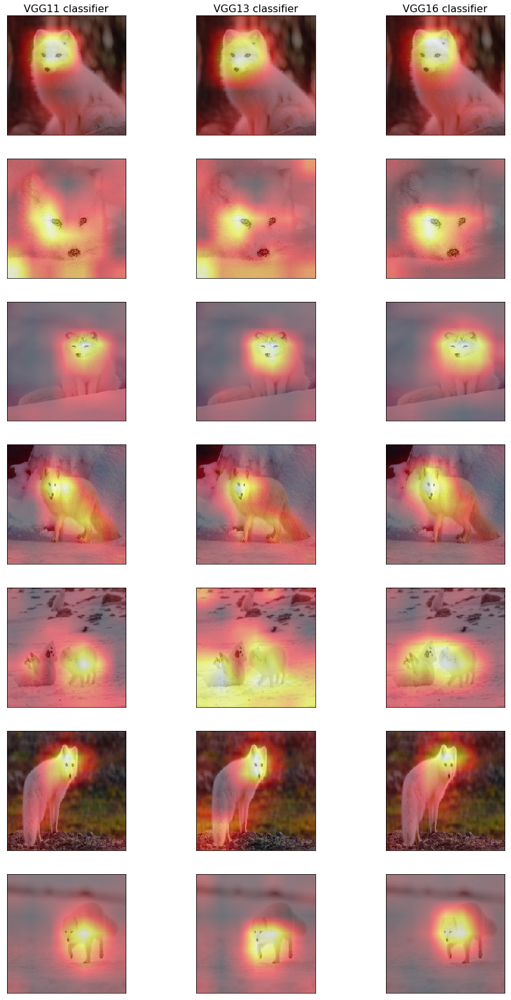

In [22]:
plot_mask_weighted_heatmaps_multiple_sces([sce6_vgg11, sce6_vgg13, sce6_vgg16], [arctic_fox_data, arctic_fox_data, arctic_fox_data], ["VGG11 classifier", "VGG13 classifier", "VGG16 classifier"])

### Experiment 7 (vggs on tiger_car)

In [14]:
vgg11_model = torchvision.models.vgg11(pretrained=True)
vgg13_model = torchvision.models.vgg13(pretrained=True)
vgg16_model = torchvision.models.vgg16(pretrained=True)

In [15]:
extractor_vgg11 = Extractor(vgg11_model)
extractor_vgg13 = Extractor(vgg13_model)
extractor_vgg16 = Extractor(vgg16_model)

model_vgg11 = extractor_vgg11
model_vgg13 = extractor_vgg13
model_vgg16 = extractor_vgg16

model_vgg11.eval()
model_vgg13.eval()
model_vgg16.eval()

In [26]:
tiger_cat_data_convolutions_vgg11 = extractor_vgg11.forward_pass_on_convolutions(tiger_cat_data)
tiger_cat_data_convolutions_vgg13 = extractor_vgg13.forward_pass_on_convolutions(tiger_cat_data)
tiger_cat_data_convolutions_vgg16 = extractor_vgg16.forward_pass_on_convolutions(tiger_cat_data)

In [27]:
sce6_vgg11 = ImageSCE(model_vgg11, target_class=tiger_cat_target)
sce6_vgg13 = ImageSCE(model_vgg13, target_class=tiger_cat_target)
sce6_vgg16 = ImageSCE(model_vgg16, target_class=tiger_cat_target)

In [28]:
sce6_vgg11.fit(tiger_cat_data_convolutions_vgg11, n_iter=100, lr=0.1, lambda_coef=0.05, mu_coef=0.2, verbose_every_iterations=10, force_masks_init=False)

[0/100] Cost: 11.801441192626953 [11.801441192626953, 0.0, 0.0]
[10/100] Cost: 10.775031089782715 [10.484691619873047, 0.2481335699558258, 0.04220610484480858]
[20/100] Cost: 9.944951057434082 [9.416165351867676, 0.4502217471599579, 0.07856368273496628]
[30/100] Cost: 9.251184463500977 [8.507316589355469, 0.6320752501487732, 0.11179297417402267]
[40/100] Cost: 8.680099487304688 [7.744750022888184, 0.7935692667961121, 0.14177948236465454]
[50/100] Cost: 8.207871437072754 [7.1012420654296875, 0.9377514719963074, 0.16887745261192322]
[60/100] Cost: 7.80471134185791 [6.542369842529297, 1.0684454441070557, 0.19389651715755463]
[70/100] Cost: 7.462434768676758 [6.059412002563477, 1.1856995820999146, 0.21732325851917267]
[80/100] Cost: 7.177544593811035 [5.6481451988220215, 1.2910040616989136, 0.23839497566223145]
[90/100] Cost: 6.944310665130615 [5.304514408111572, 1.3829063177108765, 0.2568899989128113]


In [29]:
sce6_vgg13.fit(tiger_cat_data_convolutions_vgg13, n_iter=100, lr=0.1, lambda_coef=0.05, mu_coef=0.2, verbose_every_iterations=10, force_masks_init=False)

[0/100] Cost: 12.04973030090332 [12.04973030090332, 0.0, 0.0]
[10/100] Cost: 11.289769172668457 [11.040057182312012, 0.21660232543945312, 0.033109329640865326]
[20/100] Cost: 10.631890296936035 [10.170135498046875, 0.39962145686149597, 0.06213333085179329]
[30/100] Cost: 10.048613548278809 [9.389167785644531, 0.5699106454849243, 0.08953501284122467]
[40/100] Cost: 9.546307563781738 [8.705985069274902, 0.7253324389457703, 0.11499019712209702]
[50/100] Cost: 9.109025001525879 [8.101778984069824, 0.8682842254638672, 0.13896219432353973]
[60/100] Cost: 8.721118927001953 [7.5587239265441895, 1.0009782314300537, 0.1614174097776413]
[70/100] Cost: 8.378262519836426 [7.071715831756592, 1.124113917350769, 0.18243290483951569]
[80/100] Cost: 8.077603340148926 [6.637981414794922, 1.2378560304641724, 0.20176565647125244]
[90/100] Cost: 7.818271160125732 [6.2569661140441895, 1.341875433921814, 0.21942953765392303]


In [30]:
sce6_vgg16.fit(tiger_cat_data_convolutions_vgg16, n_iter=100, lr=0.1, lambda_coef=0.05, mu_coef=0.2, verbose_every_iterations=10, force_masks_init=False)

[0/100] Cost: 12.31329345703125 [12.31329345703125, 0.0, 0.0]
[10/100] Cost: 11.446587562561035 [11.18229866027832, 0.23211021721363068, 0.032178930938243866]
[20/100] Cost: 10.71969985961914 [10.233366012573242, 0.42581525444984436, 0.06051788479089737]
[30/100] Cost: 10.07955551147461 [9.386489868164062, 0.6061922907829285, 0.08687300980091095]
[40/100] Cost: 9.518865585327148 [8.633600234985352, 0.773392915725708, 0.11187239736318588]
[50/100] Cost: 9.03007984161377 [7.967728137969971, 0.9274528622627258, 0.13489913940429688]
[60/100] Cost: 8.608755111694336 [7.384145736694336, 1.0685385465621948, 0.15607041120529175]
[70/100] Cost: 8.244025230407715 [6.87100076675415, 1.1974468231201172, 0.17557846009731293]
[80/100] Cost: 7.927182197570801 [6.417704105377197, 1.316196084022522, 0.19328229129314423]
[90/100] Cost: 7.644351482391357 [6.008726119995117, 1.4258153438568115, 0.20980969071388245]


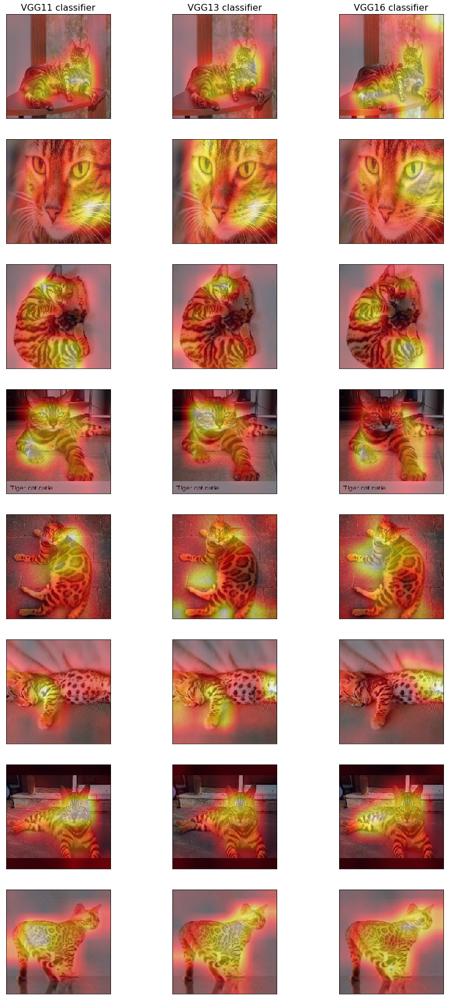

In [31]:
plot_mask_weighted_heatmaps_multiple_sces([sce6_vgg11, sce6_vgg13, sce6_vgg16], [tiger_cat_data, tiger_cat_data, tiger_cat_data], ["VGG11 classifier", "VGG13 classifier", "VGG16 classifier"])

### Experiment 7 (cat_wrong)

In [35]:
target_class = cat_wrong_target
data = cat_wrong_data
data_convolutions = cat_wrong_data_convolutions

In [37]:
sce7 = ImageSCE(model, target_class=target_class)

In [38]:
sce7.fit(cat_wrong_data_convolutions, n_iter=100, lr=0.1, lambda_coef=0.05, mu_coef=0.2, verbose_every_iterations=10, force_masks_init=False)

[0/100] Cost: 13.251365661621094 [13.251365661621094, 0.0, 0.0]
[10/100] Cost: 7.620156288146973 [6.01848030090332, 1.6016759872436523, 0.0]
[20/100] Cost: 6.111193656921387 [3.8910367488861084, 2.2201569080352783, 0.0]
[30/100] Cost: 5.474660873413086 [2.927182912826538, 2.5474777221679688, 0.0]
[40/100] Cost: 5.120781898498535 [2.4099254608154297, 2.7108566761016846, 0.0]
[50/100] Cost: 4.881539344787598 [2.0484979152679443, 2.833041191101074, 0.0]
[60/100] Cost: 4.710084915161133 [1.8013644218444824, 2.9087207317352295, 0.0]
[70/100] Cost: 4.578614711761475 [1.617937684059143, 2.960677146911621, 0.0]
[80/100] Cost: 4.485143661499023 [1.4935009479522705, 2.991642951965332, 0.0]
[90/100] Cost: 4.409450054168701 [1.3996857404708862, 3.0097644329071045, 0.0]


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/upsampling.py:129: UserWarning: nn.Upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.{} is deprecated. Use nn.functional.interpolate instead.".format(self.name))
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2423: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


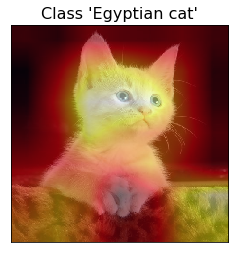

In [39]:
plot_mask_weighted_heatmaps_multiple_sces([sce7], [cat_wrong_data], ["Class 'Egyptian cat'"])